# Exercises

## Exercise 4.1
Download from figshare this [flows dataset](https://figshare.com/collections/Inter-urban_interactions_of_mobility_via_cellular_position_tracking_in_the_southeast_Songliao_Basin_Northeast_China/4226183), create a tessellation and a `FlowDataFrame`; plot them together using skmob. Then: 
- split the `FlowDataFrame` into a training set and a test set; 
- train a `Gravity` model on the training set
- test the model's goodness on the test set (qualitative and quantitative evaluation)

In [1]:
import requests, zipfile, json, io
from shapely.geometry import Point

In [58]:
import pandas as pd
import geopandas as gpd
import skmob
import matplotlib.pyplot as plt

In [3]:
dataset_links = {
'positions' : 'https://figshare.com/ndownloader/files/14005292',
'flows' : 'https://figshare.com/ndownloader/files/14884442',
}

In [4]:
#r = requests.get(dataset_links['positions'], stream=True)
#print(r.text.replace('\r', '\n'), file=open('positions.csv','w'))

In [5]:
positions_df = pd.read_csv('positions.csv')
gdf = gpd.GeoDataFrame(positions_df, 
                       geometry=gpd.points_from_xy(positions_df['Longitude'], positions_df['Latitude'])).drop(['Longitude', 'Latitude'], axis=1).rename(columns={'Location': 'tile_ID'})
gdf['tile_ID'] = gdf['tile_ID'].astype('str')
gdf.crs = 'epsg:4326'
gdf.head()

,tile_ID,geometry
0,220102001000,POINT (125.34411 43.85388)
1,220102002000,POINT (125.33147 43.88423)
2,220102003000,POINT (125.34319 43.88196)
3,220102004000,POINT (125.34254 43.89325)
4,220102005000,POINT (125.34234 43.89950)


In [6]:
#r = requests.get(dataset_links['flows'], stream=True)
#print(r.text, file=open('flows.csv','w'))

In [12]:
flows_df = pd.read_csv('flows.csv')
flows_df['Origin'].astype('str')
flows_df['Destination'].astype('str')
flows_df.head()

,Origin,Destination,Weight,Time
0,220102001000,220102001000,117,2017-08-07T01+08
1,220102001000,220102002000,1,2017-08-07T01+08
2,220102001000,220102003000,1,2017-08-07T01+08
3,220102001000,220102004000,1,2017-08-07T01+08
4,220102001000,220102005000,0,2017-08-07T01+08


In [20]:
# total outflows excluding self loops in San Francisco
tot_outflows_df = flows_df[flows_df['Origin'] != flows_df['Destination']] \
    .groupby(by='Origin', axis=0)[['Weight']].sum().fillna(0).rename(columns={'Weight': 'tot_outflow'})
tot_outflows_df.index = tot_outflows_df.index.astype('str')
gdf = gdf.merge(tot_outflows_df, right_index=True, left_on='tile_ID', how='left').fillna(0.).sort_values(by='tot_outflow', ascending=False)
gdf['relevance'] = gdf['tot_outflow'] / gdf['tot_outflow'].sum()    
gdf.head()

,tile_ID,geometry,tot_outflow,relevance
50,220106003000,POINT (125.32354 43.81707),1984779.0,0.043716
124,220173201000,POINT (125.28292 43.83187),1180943.0,0.026011
49,220106001000,POINT (125.26631 43.89533),1042391.0,0.022959
17,220103005000,POINT (125.35171 43.92011),1020404.0,0.022475
10,220102011000,POINT (125.31498 43.82417),983256.0,0.021657


In [21]:
fdf = skmob.FlowDataFrame(flows_df, 
                          origin='Origin', destination='Destination', flow='Weight', 
                          tile_id='tile_ID', tessellation=gdf)
fdf.head()

,origin,destination,flow,Time
0,220102001000,220102001000,117,2017-08-07T01+08
1,220102001000,220102002000,1,2017-08-07T01+08
2,220102001000,220102003000,1,2017-08-07T01+08
3,220102001000,220102004000,1,2017-08-07T01+08
4,220102001000,220102005000,0,2017-08-07T01+08


In [22]:
from skmob.models import gravity

In [31]:
gravity_singly = gravity.Gravity(gravity_type='singly constrained')
print(gravity_singly)

Gravity(name="Gravity model", deterrence_func_type="power_law", deterrence_func_args=[-2.0], origin_exp=1.0, destination_exp=1.0, gravity_type="singly constrained")


In [29]:
import numpy as np

In [33]:
np.random.seed(0)
gen_fdf = gravity_singly.generate(gdf, 
                tile_id_column='tile_ID', 
                tot_outflows_column='tot_outflow', 
                relevance_column= 'relevance', out_format='flows')
gen_fdf.head()

100%|██████████████████████████████████████████████████████████████| 174/174 [00:00<00:00, 7722.68it/s]
/Users/lucapappalardo/opt/anaconda3/envs/GSA/lib/python3.9/site-packages/skmob/models/gravity.py:43: RuntimeWarning: divide by zero encountered in power
  return np.power(x, exponent)
/Users/lucapappalardo/opt/anaconda3/envs/GSA/lib/python3.9/site-packages/skmob/models/gravity.py:298: RuntimeWarning: invalid value encountered in multiply
  trip_probs_matrix = trip_probs_matrix * relevances_dest ** self.destination_exp * \
/Users/lucapappalardo/opt/anaconda3/envs/GSA/lib/python3.9/site-packages/skmob/models/gravity.py:378: RuntimeWarning: invalid value encountered in divide
  trip_probs_matrix = (trip_probs_matrix.T / np.sum(trip_probs_matrix, axis=1)).T


,origin,destination,flow
0,220106003000,220173201000,1.081795e+05
1,220106003000,220106001000,1.314865e+04
2,220106003000,220103005000,9.134714e+03
3,220106003000,220102011000,1.096793e+06
4,220106003000,220104007000,2.725596e+04


In [34]:
gen_fdf.plot_flows(min_flow=500)

In [46]:
baseline = gravity.Gravity(gravity_type='singly constrained', 
                   deterrence_func_args=[0.], destination_exp=0.)
print(baseline)

Gravity(name="Gravity model", deterrence_func_type="power_law", deterrence_func_args=[0.0], origin_exp=1.0, destination_exp=0.0, gravity_type="singly constrained")


In [47]:
np.random.seed(0)
baseline_fdf = baseline.generate(gdf, 
                                   tile_id_column='tile_ID', 
                                   tot_outflows_column='tot_outflow', 
                                   relevance_column= 'relevance',
                                   out_format='flows')
baseline_fdf.head()

100%|██████████████████████████████████████████████████████████████| 174/174 [00:00<00:00, 7889.31it/s]
/Users/lucapappalardo/opt/anaconda3/envs/GSA/lib/python3.9/site-packages/skmob/models/gravity.py:378: RuntimeWarning: invalid value encountered in divide
  trip_probs_matrix = (trip_probs_matrix.T / np.sum(trip_probs_matrix, axis=1)).T


,origin,destination,flow
0,220106003000,220173201000,11472.710983
1,220106003000,220106001000,11472.710983
2,220106003000,220103005000,11472.710983
3,220106003000,220102011000,11472.710983
4,220106003000,220104007000,11472.710983


In [52]:
len(baseline_fdf)

28891

In [53]:
xy = fdf.merge(gen_fdf, on=['origin', 'destination'])[['flow_x', 'flow_y']].values
xy_baseline = fdf.merge(baseline_fdf, on=['origin', 'destination'])[['flow_x', 'flow_y']].values

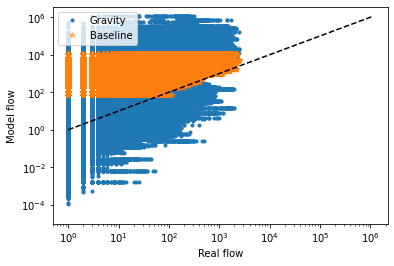

In [59]:
plt.plot(xy[:,0], xy[:,1], '.', label='Gravity')
plt.plot(xy_baseline[:,0], xy_baseline[:,1], '*', alpha=0.5, label='Baseline')
x = np.logspace(0, np.log10(np.max(xy)))
plt.plot(x, x, '--k')
plt.xlabel('Real flow'); plt.ylabel('Model flow')
plt.legend(loc = 'upper left')
plt.loglog(); plt.show()

In [54]:
from skmob.measures.evaluation import r_squared, mse, spearman_correlation, pearson_correlation, common_part_of_commuters, common_part_of_commuters_distance

In [55]:
metrics = [r_squared, mse, spearman_correlation, pearson_correlation, common_part_of_commuters, common_part_of_commuters_distance]
names = ['r_squared', 'mse', 'spearman_correlation', 'pearson_correlation', 'common_part_of_commuters', 'common_part_of_commuters_distance']

In [56]:
print('Metric:  Gravity - Baseline')
print('---------------------------')
for i, metric in enumerate(metrics):
    m = metric(xy[:, 0], xy[:, 1])
    b = metric(xy_baseline[:, 0], xy_baseline[:, 1])
    print("%s:   %s - %s" % (names[i], np.round(m, 3), np.round(b, 3)))

Metric:  Gravity - Baseline
---------------------------
r_squared:   -44916.693 - -1412.265
mse:   175098483.823 - 5506861.056
spearman_correlation:   [0.506 0.   ] - [0.318 0.   ]
pearson_correlation:   [0.399 0.   ] - [0.175 0.   ]
common_part_of_commuters:   0.011 - 0.012
common_part_of_commuters_distance:   0.034 - 0.001


In [61]:
len(fdf)

4685352